#Text Summarisation on the basis of Luhn's Algorithm

Luhn's Algorithm is a modified version of Frequency Based Test Summarisation Algorithm with a slight more compplex calculations

This method was suggested by **H.P Luhn** in 1958

```
https://courses.ischool.berkeley.edu/i256/f06/papers/luhn58.pdf
```

##Importing the Libraries


In [ ]:
import re
import nltk
import string
import heapq

In [ ]:
# We will also download 'PUNKT' and 'STOPWORDS' library in this section as well
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

## Importing the Input Text

In [ ]:
original_text = """Artificial intelligence is human like intelligence machines.
                   It is the study of intelligent artificial agents.
                   Science and engineering to produce intelligent machines.
                   Solve problems and have intelligence.
                   Related to intelligent behavior machines.
                   Developing of reasoning machines.
                   Learn from mistakes and successes.
                   Artificial intelligence is related to reasoning in everyday situations."""
original_text = re.sub(r'\s+', ' ', original_text)
original_text

'Artificial intelligence is human like intelligence machines. It is the study of intelligent artificial agents. Science and engineering to produce intelligent machines. Solve problems and have intelligence. Related to intelligent behavior machines. Developing of reasoning machines. Learn from mistakes and successes. Artificial intelligence is related to reasoning in everyday situations.'

## Preprocessing Function

In [ ]:
stopwords = nltk.corpus.stopwords.words('english')
# We can add custom stopwords as well
stopwords.append('https')

def preprocess(text):
  formatted_text = text.lower()
  tokens = []
  for token in nltk.word_tokenize(formatted_text):
    tokens.append(token)
  tokens = [word for word in tokens if word not in stopwords and word not in string.punctuation]
  formatted_text = ' '.join(element for element in tokens)

  return formatted_text

In [ ]:
formatted_text = preprocess(original_text)
formatted_text

'artificial intelligence human like intelligence machines study intelligent artificial agents science engineering produce intelligent machines solve problems intelligence related intelligent behavior machines developing reasoning machines learn mistakes successes artificial intelligence related reasoning everyday situations'

## Calculation Function

First we find the indexes of important words in these individual sentences

After we have obtained the indexes, we will find the **Distances** between each top n words in order for us to calculate the **Score** of each of these sentences

For the scoring, we take the score of the sentence to be the highest scores among different groups that exist in the group_list

Finally after getting scores, we need to sort the list on the basis of scores in order to get a decreasing order of importance of list

In [ ]:
def calculate_scores(sentences, top_n_words, distance):
  scores = []
  sentence_index = 0

  for sentence in [nltk.word_tokenize(sentence) for sentence in sentences]:
    word_index = []
    for word in top_n_words:
      try:
        word_index.append(sentence.index(word))
      except ValueError:
        pass

    word_index.sort()

    # After sorting if we have an empty array, then we will skip (as there are no important words in it!)
    if len(word_index) == 0:
      continue

    groups_list = []
    group = [word_index[0]]
    i = 1

    # We are having two groups, one which has the pairs of distance more than input distance and the other which has less distance
    while i < len(word_index):
      if word_index[i] - word_index[i-1] < distance:
        group.append(word_index[i])

      else:
        groups_list.append(group[:])
        group = [word_index[i]]
      i=i+1

    groups_list.append(group)

    max_group_score = 0
    for g in groups_list:
      important_words_in_group = len(g)
      total_words_in_group = g[-1] - g[0] + 1
      score = (1.0 * (important_words_in_group)**2) / total_words_in_group

      if score > max_group_score:
        max_group_score = score

    scores.append((max_group_score, sentence_index))
    sentence_index += 1

  return scores

**NOTE :** The more words in the same group, the more important the sentence!

## Summarising Function

Here we first get the individual sentences by using the **sent_tokenize** method and after that we will use the **word_tokenize** method to get the individual words

On getting the individual words, we will use the **FreqDis** method to get a count table of frequency of words!

**NOTE : IT IS BETTER TO USE A PERCENTAGE SYSTEM, AS FOR MULTIPLE ARTICLES, WE ARE GOING TO HAVE DIFFERENT LENGTH WHILE THE PERCENTAGE WOULD CONSIDER ONLY THR TOP X % OF ARTICLES**

In [ ]:
def summarise(input_text, top_n_words, distance, number_of_sentences, percentage):
  original_sentences = [sentence for sentence in nltk.sent_tokenize(input_text)]
  formatted_sentence = [preprocess(original_sentence) for original_sentence in original_sentences]

  words = [word for sentence in formatted_sentence for word in nltk.tokenize.word_tokenize(sentence)]
  freq = nltk.FreqDist(words)

  top_n_words = [word[0] for word in freq.most_common(top_n_words)]
  sentences_score = calculate_scores(formatted_sentence, top_n_words, distance)

  if percentage > 0:
      best_sentences = heapq.nlargest(int(len(formatted_sentence) * percentage), sentences_score)
  else:
      best_sentences = heapq.nlargest(number_of_sentences, sentences_score)

  best_sentences = [original_sentences[i] for (score, i) in best_sentences]
  return original_sentences, best_sentences, sentences_score

##Testing

In [ ]:
original_sentences, best_sentences, sentences_score = summarise(original_text, 5, 2, 3, 0)

In [ ]:
# Original Sentence
original_sentences

['Artificial intelligence is human like intelligence machines.',
 'It is the study of intelligent artificial agents.',
 'Science and engineering to produce intelligent machines.',
 'Solve problems and have intelligence.',
 'Related to intelligent behavior machines.',
 'Developing of reasoning machines.',
 'Learn from mistakes and successes.',
 'Artificial intelligence is related to reasoning in everyday situations.']

In [ ]:
# Best Sentence
best_sentences

['Learn from mistakes and successes.',
 'Related to intelligent behavior machines.',
 'Science and engineering to produce intelligent machines.']

In [ ]:
# Sentences score
sentences_score

[(2.0, 0), (2.0, 1), (2.0, 2), (1.0, 3), (2.0, 4), (1.0, 5), (3.0, 6)]

## Visualsing the summary and HTML

In [ ]:
from IPython.core.display import HTML
text = ''

display(HTML(f'<h1>Summary</h1>'))
for sentence in original_sentences:
  if sentence in best_sentences:
    text += ' ' + str(sentence).replace(sentence, f"<mark>{sentence}</mark>")
  else:
    text += ' ' + sentence
display(HTML(f""" {text} """))

##Extracting texts from Internet

To extract articles from the Internet, we use a library called **goose3**

In [ ]:
!pip install goose3;

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.7/88.7 kB 1.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.5/981.5 kB 21.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.8/110.8 kB 14.1 MB/s eta 0:00:00
  Created wheel for langdetect: filename=langdetect-1.0.9-py3-none-any.whl size=993225 sha256=b2e1ca9516072f281ef261fa8a517952d2ba2e6ec4e599180ae272b7ee22fb5b
  Stored in directory: /root/.cache/pip/wheels/95/03/7d/59ea870c70ce4e5a370638b5462a7711ab78fba2f655d05106
Successfully built langdetect


In [ ]:
from goose3 import Goose
url = 'https://en.wikipedia.org/wiki/KSI'

**NOTE** : The Goose module has an inbuilt preprocessing on using the extract syntax and can be accessed with the cleaned_text method

```
article = Goose.extract('enter url')
article.cleaned_text
```

In [ ]:
g = Goose()
article = g.extract(url)
article.cleaned_text

'Olajide Olayinka Williams "JJ" Olatunji (born 19 June 1993), known professionally as KSI, is an English Internet personality, professional boxer and musician. He is the CEO of Misfits Boxing and the co-owner of Prime Hydration, XIX Vodka, Sidemen Clothing, and a restaurant chain known as Sides.\n\nHe registered his main YouTube channel in 2009 and has since built a following posting gaming commentary videos of the FIFA video game series. His content later diversified to include vlog and comedy-style videos. As of October 2022, he has over 41 million subscribers and over 10 billion video views across his three YouTube channels.\n\nHe featured in the British comedy film Laid in America in 2016 and was the subject of KSI: Can\'t Lose in 2018, a documentary film following the build-up to his first boxing match, and KSI: In Real Life in 2023, an Amazon Prime Video documentary film following his life from June 2021 to October 2022.\n\nHis debut studio album, Dissimulation, released in 2020 

In [ ]:
# Lets call the summarise function
original_sentences, best_sentences, sentences_score = summarise(article.cleaned_text, 300, 10, 50, 0)

*Lets compare the length of original and best sentences*

In [ ]:
print(f'Original Sentence : {len(original_sentences)}')
print(f'Best Sentence : {len(best_sentences)}')

print(f'Percentage used : {((len(best_sentences)) / len(original_sentences)) * 100}')

Original Sentence : 191
Best Sentence : 50
Percentage used : 26.17801047120419


In [ ]:
best_sentences

["He featured in the British comedy film Laid in America in 2016 and was the subject of KSI: Can't Lose in 2018, a documentary film following the build-up to his first boxing match, and KSI: In Real Life in 2023, an Amazon Prime Video documentary film following his life from June 2021 to October 2022.",
 '[70][33]\n\n2020–2021: All Over the Place and The Online Takeover\n\nOn 23 October 2020, KSI released the first single from his second album, "Really Love" featuring Craig David and Digital Farm Animals, which peaked at number three on the UK Singles Chart and has been certified gold by the BPI.',
 '[110]\n\nOn 22 March, it was announced that KSI would face businessman and professional boxer Joe Fournier as the headliner of MF & DAZN: X Series 007 on 13 May at Wembley Arena in London, England.',
 'Two further boxing events against American YouTuber Logan Paul took place, the second of which was a professional bout in which he won via split decision in November 2019.',
 '[76][77] On 26

In [ ]:
sentences_score

[(11.842105263157896, 0),
 (3.0, 1),
 (10.5625, 2),
 (1.2857142857142858, 3),
 (6.75, 4),
 (20.82857142857143, 5),
 (12.0, 6),
 (9.0, 7),
 (5.785714285714286, 8),
 (7.0, 9),
 (17.0, 10),
 (12.071428571428571, 11),
 (15.0, 12),
 (9.090909090909092, 13),
 (3.5714285714285716, 14),
 (0.8, 15),
 (1.0, 16),
 (2.0, 17),
 (7.363636363636363, 18),
 (4.571428571428571, 19),
 (7.111111111111111, 20),
 (14.08695652173913, 21),
 (4.0, 22),
 (3.0, 23),
 (1.5, 24),
 (4.083333333333333, 25),
 (4.0, 26),
 (10.285714285714286, 27),
 (4.764705882352941, 28),
 (3.769230769230769, 29),
 (3.6, 30),
 (10.027777777777779, 31),
 (6.125, 32),
 (12.0, 33),
 (3.0625, 34),
 (3.125, 35),
 (13.473684210526315, 36),
 (6.230769230769231, 37),
 (7.6923076923076925, 38),
 (8.1, 39),
 (11.842105263157896, 40),
 (9.090909090909092, 41),
 (5.142857142857143, 42),
 (12.071428571428571, 43),
 (12.96, 44),
 (8.0, 45),
 (12.96, 46),
 (12.8, 47),
 (9.8, 48),
 (8.909090909090908, 49),
 (7.111111111111111, 50),
 (6.25, 51),
 (11

In [ ]:
# Lets summarise

from IPython.core.display import HTML
text = ''

display(HTML(f'<h1>Summary</h1>'))
for sentence in original_sentences:
  if sentence in best_sentences:
    text += ' ' + str(sentence).replace(sentence, f"<mark>{sentence}</mark>")
  else:
    text += ' ' + sentence
display(HTML(f""" {text} """))

## Reading from RSS feeds

RSS is a web feed that allows users and applications to access updates to websites in a standardized, computer-readable format

To accomplish this, we need to use **feedparser** package

Since FeedParser package is not inbuilt, therefore, we have to install feeparser with the following syntax

```
!pip install feedparser
from bs4 import BeatifulSoup

# From the bs4 module, we will import BeautifulSoup which is an amazing library for prep process text, especially the text imported from the Internet
```

We will also import **json** as most of the data across in the net is stored in JSON format

In [ ]:
!pip install feedparser

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.1/81.1 kB 1.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for sgmllib3k: filename=sgmllib3k-1.0.0-py3-none-any.whl size=6048 sha256=3bc418ec7d1ca2f141958a3b8ac4e22b0a5224bbc55acbaafac1f0d99c3c4a2d
  Stored in directory: /root/.cache/pip/wheels/f0/69/93/a47e9d621be168e9e33c7ce60524393c0b92ae83cf6c6e89c5
Successfully built sgmllib3k


In [ ]:
import feedparser
from bs4 import BeautifulSoup
import os
import json

In [ ]:
url = 'https://audioboom.com/channels/4997220.rss'
feed = feedparser.parse(url)

To have a look at the entries we use the entries method

In [ ]:
feed.entries

[{'title': 'Episode 517: The Black Sisters and the Murder of Ocey Snead',
  'title_detail': {'type': 'text/plain',
   'language': None,
   'base': 'https://rss.art19.com/morbid-a-true-crime-podcast',
   'value': 'Episode 517: The Black Sisters and the Murder of Ocey Snead'},
  'summary': '<p>When East Orange, New Jersey police were called to the home of Virginia Wardlaw in late November 1909, they knew only that there had been an accident involving Virginia’s niece, Ocey Snead. Once they’d arrived, however, officers discovered Ocey’s body in an upstairs bathtub, dead from what appeared to be suicide by drowning.</p><p><br /></p><p>After just a few weeks of investigation, it became clear that Ocey’s death was no accident. Suspicion quickly fell on Virginia and her two sisters, who were soon charged with Ocey’s murder, which investigators believed was committed in order to collect on a large insurance</p><p>policy.</p><p><br /></p><p>The murder of Ocey Snead was an undeniable tragedy, bu

In [ ]:
# For titles and content

for e in feed.entries:
  print(e.title)
  print(e.content[0].value)
  print('\n--------------------------')

Episode 517: The Black Sisters and the Murder of Ocey Snead
When East Orange, New Jersey police were called to the home of Virginia Wardlaw in late November 1909, they knew only that there had been an accident involving Virginia’s niece, Ocey Snead. Once they’d arrived, however, officers discovered Ocey’s body in an upstairs bathtub, dead from what appeared to be suicide by drowning.




After just a few weeks of investigation, it became clear that Ocey’s death was no accident. Suspicion quickly fell on Virginia and her two sisters, who were soon charged with Ocey’s murder, which investigators believed was committed in order to collect on a large insurance

policy.




The murder of Ocey Snead was an undeniable tragedy, but her death was only the beginning of what would become one of the early twentieth century’s most captivating crime stories. As detectives and the press dug deeper into the background of the three women accused of starving and drowning their niece, a bizarre story eme

## We need to clean the HTML text

In [ ]:
def clean_html(text):
  if text == '':
    return ''
  else:
    return BeautifulSoup(text, 'html5lib').get_text()

In [ ]:
e.content[0].value

"Alaina is an autopsy technician with a passion for science, true crime and all things creepy. Ashleigh is a hair stylist who may look glamorous on the outside, but houses spooky core.\nNow that this bad Larry has been identified, it seemed like a perfect debut episode. Come take a look through the crimes and capture of Joseph James DeAngelo AKA The Golden State Killer, The East Area Rapist, The Diamond Knot Killer and The Original Nightstalker. He may have began his reign of terror way back in 1976 but he was able to continue it for four decades before pesky familial DNA was able to take him down. Isn't science great?\n\nSee Privacy Policy at https://art19.com/privacy and California Privacy Notice at https://art19.com/privacy#do-not-sell-my-info."

In [ ]:
# After cleaning

clean_html(e.content[0].value)

"Alaina is an autopsy technician with a passion for science, true crime and all things creepy. Ashleigh is a hair stylist who may look glamorous on the outside, but houses spooky core.\nNow that this bad Larry has been identified, it seemed like a perfect debut episode. Come take a look through the crimes and capture of Joseph James DeAngelo AKA The Golden State Killer, The East Area Rapist, The Diamond Knot Killer and The Original Nightstalker. He may have began his reign of terror way back in 1976 but he was able to continue it for four decades before pesky familial DNA was able to take him down. Isn't science great?\n\nSee Privacy Policy at https://art19.com/privacy and California Privacy Notice at https://art19.com/privacy#do-not-sell-my-info."

In [ ]:
# Lets start working with the feed

articles = []
for e in feed.entries:
  articles.append({'title' : e.title, 'content' : clean_html(e.content[0].value)})

<ipython-input-36-c70cc0e6964d>:5: MarkupResemblesLocatorWarning: The input looks more like a filename than markup. You may want to open this file and pass the filehandle into Beautiful Soup.
  return BeautifulSoup(text, 'html5lib').get_text()


##Saving a file in Colab

In [ ]:
save_file = os.path.join('rssFeed.json')
feed = open(save_file, 'w+')
feed.write(json.dumps(articles, indent=1))
feed.close()

## Reading a JSON file

In [ ]:
blog_articles = json.loads(open('rssFeed.json').read())
blog_articles

[{'title': 'Episode 517: The Black Sisters and the Murder of Ocey Snead',
  'content': 'When East Orange, New Jersey police were called to the home of Virginia Wardlaw in late November 1909, they knew only that there had been an accident involving Virginia’s niece, Ocey Snead. Once they’d arrived, however, officers discovered Ocey’s body in an upstairs bathtub, dead from what appeared to be suicide by drowning.\n\n\n\n\nAfter just a few weeks of investigation, it became clear that Ocey’s death was no accident. Suspicion quickly fell on Virginia and her two sisters, who were soon charged with Ocey’s murder, which investigators believed was committed in order to collect on a large insurance\n\npolicy.\n\n\n\n\nThe murder of Ocey Snead was an undeniable tragedy, but her death was only the beginning of what would become one of the early twentieth century’s most captivating crime stories. As detectives and the press dug deeper into the background of the three women accused of starving and d

##Generating Word Clouds

We can create words clouds of most frequent words used by concatenating different articles together

In [ ]:
feed_content = ''

for article in blog_articles:
  feed_content += article['content']

In [ ]:
# Lets create the formatted version of it

formatted_feed_content = preprocess(feed_content)
formatted_feed_content

"east orange new jersey police called home virginia wardlaw late november 1909 knew accident involving virginia ’ niece ocey snead ’ arrived however officers discovered ocey ’ body upstairs bathtub dead appeared suicide drowning weeks investigation became clear ocey ’ death accident suspicion quickly fell virginia two sisters soon charged ocey ’ murder investigators believed committed order collect large insurance policy murder ocey snead undeniable tragedy death beginning would become one early twentieth century ’ captivating crime stories detectives press dug deeper background three women accused starving drowning niece bizarre story emerged sounded though pulled directly pages classic southern gothic horror novel like good gothic horror story trial virginia wardlaw sisters full unbelievable twists culminated shocking conclusion thank wondrous dave white bring axe podcast research references new york times 1910 `` alienists declare mrs. martin insane '' new york times september 21 6 

Now we will use the **wordcloud** library to import the WordCloud module

```
from wordcloud import WordCloud
import matplotlib.pyplot as plt
```

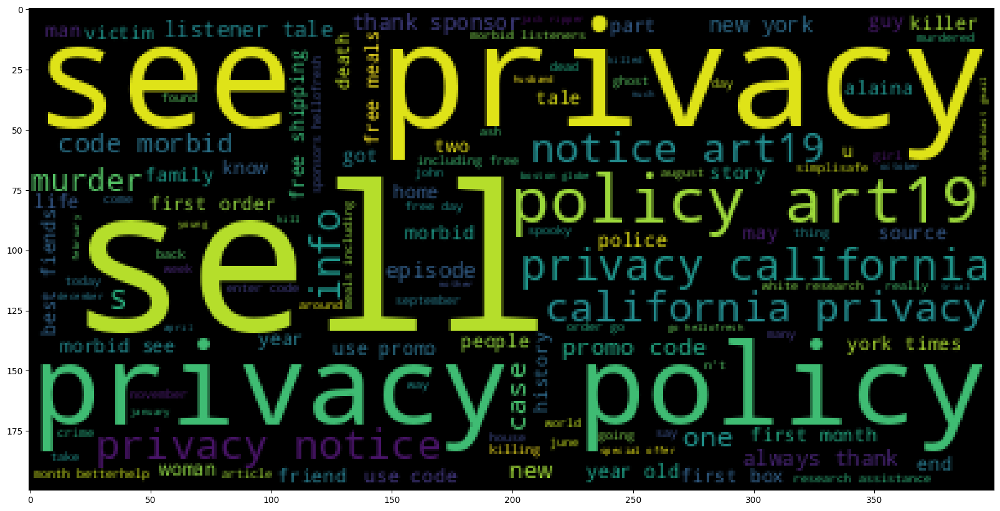

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
plt.figure(figsize=(20,20))

plt.imshow(WordCloud().generate(formatted_feed_content));

## Extracting Named Entites

For this purpose we use the common nlp library called as **spacy**

```
import spacy
nlp = spacy.load('en')       # Loads categories according to English Lexicon

```

In [ ]:
import spacy
nlp = spacy.load("en_core_web_sm")
document = nlp(formatted_feed_content)

To display the text, we use the displacy method

In [ ]:
from spacy import displacy
displacy.render(document, style='ent', jupyter=True)

We can also get a list of any specific category

In [ ]:
for entity in document.ents:
  if entity.labels_ == 'GPE':
    print(entity.text, entity.labels_)

AttributeError: ignored

##Saving a summary

Many times, it is better to save the summary in form of HTMl, so that others who only want the summary can refer to the page

In [ ]:
def save_summary(title, original_sentences, best_sentences):
  HTML_TEMPLATE = """<html>
    <head>
      <title>{0}</title>
      <meta http-equiv="Content-Type" content="text/html; charset=UTF-8" />
    </head>
    <body>{1}</body>

  </html>"""
  text = ''
  for sentence in original_sentences:
    if sentence in best_sentences:
      text += str(sentence).replace(sentence, f"<mark>{sentence}</mark>")
    else:
      text += sentence

  save_file = open(os.path.join(title + '.html'), 'wb')
  html_file = HTML_TEMPLATE.format(title, text)
  save_file.write(html_file.encode('utf-8'))
  save_file.close()